#Importing Libraries

---

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
import glob
from itertools import groupby
import matplotlib.pyplot as plt
from fastai import *
from fastai.vision import *
from google.colab import drive
import pandas as pd
import numpy as np
import collections

# **Importing Our Dataset**

---


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Path to paintings directory 
paintings_path = "/content/drive/MyDrive/Art/Resized/Resized"
#ap = "/content/drive/MyDrive/Art/Images/Images/*/"
# Extracting artist names
artists_file_path = glob.glob(paintings_path + '/*.jpg')
print(artists_file_path)

['/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_16.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_17.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_18.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_19.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_20.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_21.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_22.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_23.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_24.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_25.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_26.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_27.jpg', '/content/drive/MyDrive/Art/Resized/Resized/The Panicked Architect_28.jpg', '/content/d

In [ ]:

# Storing list of artist names
list_of_artists = []

for filename in artists_file_path:
    artist_name = ""
    artist_path = (filename.split("/")[6].split("_"))[0:-1]
    for item in artist_path:
        artist_name = artist_name + " " + item
    list_of_artists.append(artist_name)

In [ ]:
# Storing frequency of paintings per artist
artist_frequency = {value: len(list(freq)) for value, freq in groupby(sorted(list_of_artists))}
sorted_artist_frequency = OrderedDict(sorted(artist_frequency.items(), key=lambda t: t[1]))
print(artist_frequency)

{'': 700}


# Analyzing Our Dataset

In [ ]:
print("Number of Artists: " + str(len(artist_frequency)))
print("Maxmimum Number of Paintigs Per Artist: " + str(max(artist_frequency.values())))
print("Minimum Number of Paintigs Per Artitst: " + str(min(artist_frequency.values())))

Number of Artists: 1
Maxmimum Number of Paintigs Per Artist: 700
Minimum Number of Paintigs Per Artitst: 700


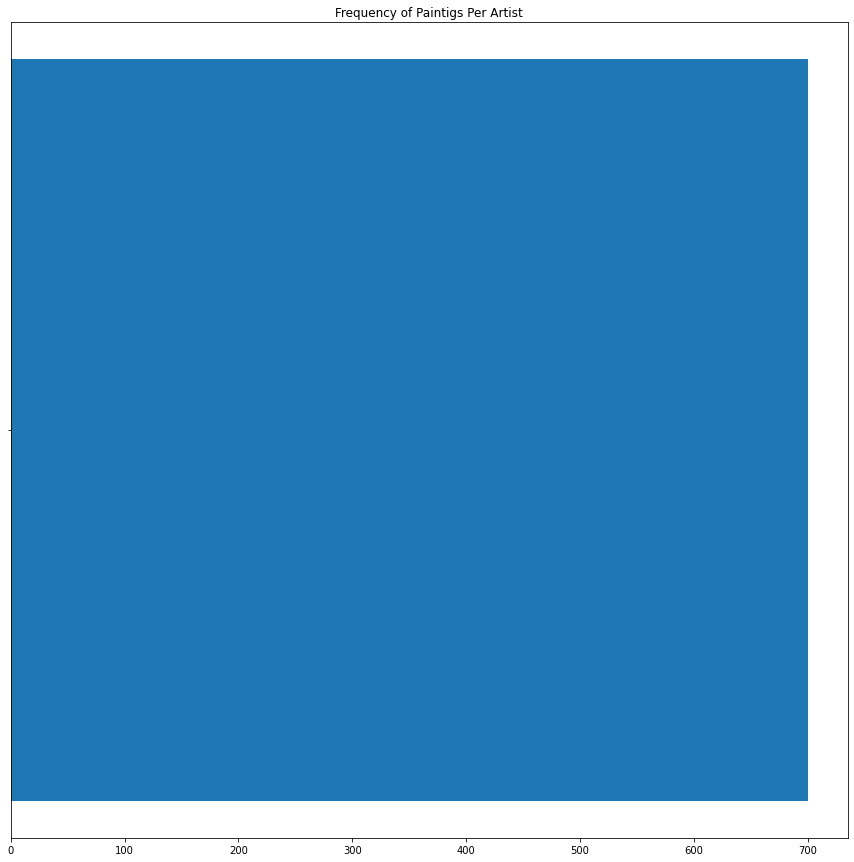

In [ ]:
# Horizontal Bar Graph of Frequency of Paintigs Per Artist
artists = list(sorted_artist_frequency.keys())
frequency = list(sorted_artist_frequency.values())

x_pos = range(len(sorted_artist_frequency))

plt.figure(figsize=(15,15))
plt.barh(x_pos, frequency)
plt.title("Frequency of Paintigs Per Artist")

plt.yticks(x_pos, artists)

plt.show()

# Training The Model

In [ ]:
# do_Flip = True --> images are being trained flipped and in several rotations
#get_transforms(): to quickly get a set of random transforms that have worked well in a wide range of tasks
tfms = get_transforms()

artist_names = get_image_files(paintings_path)

#https://fastai1.fast.ai/vision.data.html#ImageDataBunch.from_name_re
#Gets the labels from the filenames using a regular expression
#ds_tfms = datasets contains the data: train, validation and optionally test sets.
data = ImageDataBunch.from_name_re(
    paintings_path,
    artist_names,
    r'/([^/]+)_\d+.jpg$',
    ds_tfms=get_transforms(),
    size=224,
    num_workers=0
)
data.normalize(imagenet_stats)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

ImageDataBunch;

Train: LabelList (560 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
The Panicked Architect,The Panicked Architect,The Panicked Architect,The Panicked Architect,The Panicked Architect
Path: /content/drive/MyDrive/Art/Resized/Resized;

Valid: LabelList (139 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Teabag Stories,DarkaakArts,Chandra Sarkar,Teabag Stories,Teabag Stories
Path: /content/drive/MyDrive/Art/Resized/Resized;

Test: None

In [ ]:
#This package adds support for CUDA tensor types, that implement the same function as CPU tensors, but they utilize GPUs for computation.
#The torch package contains data structures for multi-dimensional tensors and defines mathematical operations over these tensor
#https://pytorch.org/docs/stable/torch.html

defaults.device = torch.device('cuda')

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

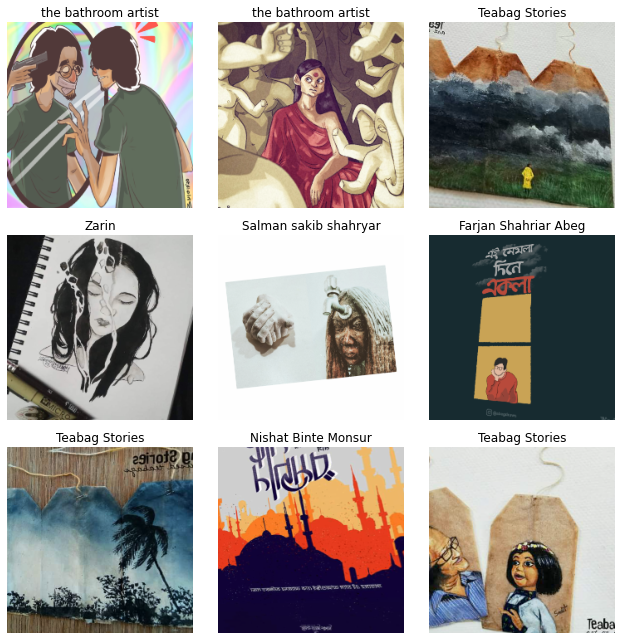

In [ ]:
# Previewing a sample batch
data.show_batch(rows=3, figsize=(9,9))

In [ ]:
# Printing Classes
data.classes

['Chandra Sarkar',
 'DarkaakArts',
 'Farjan Shahriar Abeg',
 'Icecream Stick Art',
 'Injamamul Adittya',
 'Mahatab Rashid',
 'Nishat Binte Monsur',
 'Salman sakib shahryar',
 'TarTin',
 'Teabag Stories',
 'The Panicked Architect',
 'Zarin',
 'inksmith',
 'nycto',
 'the bathroom artist']

### RESNET 152

In [ ]:
# Using resnet152 --> transfer learning
# Metrics --> error_rate,accuracy,mean_squared_error,top_k_accuracy,r2_score
#https://docs.fast.ai/vision.learner.html#cnn_learner

artist_identification = cnn_learner(data, models.resnet152, metrics=(error_rate,accuracy), 
                                    model_dir='/content/drive/My Drive/Colab Notebooks/models')

In [ ]:
#fit_one_cycle() uses large, cyclical learning rates to train models significantly quicker and with higher accuracy
#When training Deep Learning models with Fastai it is recommended to use the fit_one_cycle() method, 
#due to its better performance in speed and accuracy, over the fit() method.
#fit_one_cycle() is Fastai’s implementation of Leslie Smith’s 1cycle policy. 
#Smith developed, refined and publicised his methodology over three research papers
#https://iconof.com/1cycle-learning-rate-policy/

artist_identification.fit_one_cycle(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,2.887425,1.812359,0.417266,0.582734,02:20
1,1.681933,0.852733,0.280576,0.719424,00:55
2,1.176980,0.668797,0.194245,0.805755,00:48


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

In [58]:
artist_identification.save('version_152n_1.0')

In [59]:
#Initiating refit and checking LR
artist_identification.load('version_152n_1.0')
#As you guessed at, freezing prevents the weights of a neural network layer from being modified during the backward pass of training. 
#You progressively 'lock-in' the weights for each layer to reduce the amount of computation in the backward pass and decrease training time.
#You can unfreeze a model if you decide you want to continue training - an example of this is transfer learning: 
#start with a pre-trained model, unfreeze the weights, then continuing training on a different dataset. 
#When you choose to freeze is a balance between freezing early enough to gain computational speed-up without freezing too early 
#with weights that result in inaccurate predictions.
artist_identification.unfreeze()
#Launch a mock training to find a good learning rate, return lr_min, lr_steep if suggestions is True
#https://docs.fast.ai/callback.schedule.html#Learner.lr_find
artist_identification.lr_find() 

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


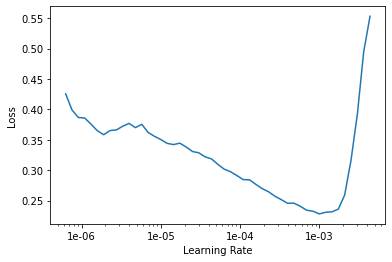

In [60]:
artist_identification.recorder.plot()

In [61]:
#The lowest loss is at 1e-03 and loss increases from after 1e-04. Refitting by modulating LR
artist_identification.fit_one_cycle(2,max_lr=slice(1e-05,1e-03))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.347290,0.732208,0.223022,0.776978,00:51
1,0.249472,0.643858,0.187050,0.812950,00:51


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

In [62]:
artist_identification.save('version_152n_2.0')

In [63]:
artist_identification.unfreeze()
artist_identification.lr_find()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


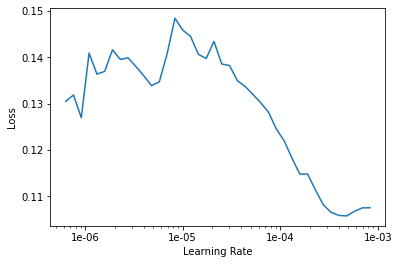

In [64]:
artist_identification.recorder.plot()

In [65]:
#The lowest loss is at 1e-03 and loss increases from after 1e-03. Refitting by modulating LR
artist_identification.fit_one_cycle(2,max_lr=slice(1e-05,1e-03))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.122382,0.581132,0.194245,0.805755,00:51
1,0.114700,0.589648,0.208633,0.791367,00:53


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

In [66]:
artist_identification.save('version_152n_3.0')

In [67]:
artist_identification.unfreeze()
artist_identification.lr_find()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


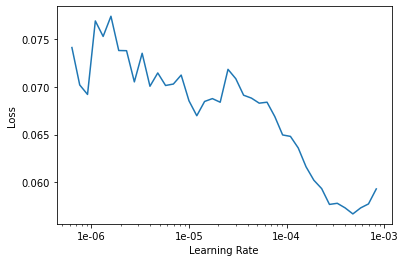

In [68]:
artist_identification.recorder.plot()

In [69]:
#The lowest loss is at 1e-06 and loss increases from after 1e-04. Refitting by modulating LR
artist_identification.fit_one_cycle(2,max_lr=slice(1e-04,1e-03))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.144801,0.724745,0.194245,0.805755,00:50
1,0.231731,0.858329,0.230216,0.769784,00:52


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

In [70]:
artist_identification.save('version_152n_4.0')

In [71]:
artist_identification.unfreeze()
artist_identification.lr_find()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


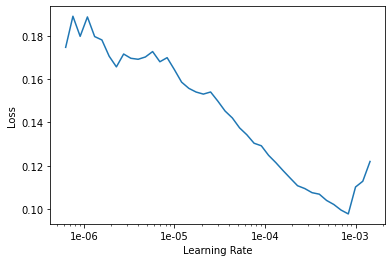

In [72]:
artist_identification.recorder.plot()

In [73]:
artist_identification.fit_one_cycle(2,max_lr=slice(1e-05,1e-03))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.149004,0.624395,0.201439,0.798561,00:51
1,0.099503,0.489685,0.143885,0.856115,00:51


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

In [74]:
artist_identification.save('version_152n_6.0')

In [75]:
artist_identification.load('version_152n_4.0')

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

Learner(data=ImageDataBunch;

Train: LabelList (560 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
The Panicked Architect,The Panicked Architect,The Panicked Architect,The Panicked Architect,The Panicked Architect
Path: /content/drive/MyDrive/Art/Resized/Resized;

Valid: LabelList (139 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
Teabag Stories,DarkaakArts,Chandra Sarkar,Teabag Stories,Teabag Stories
Path: /content/drive/MyDrive/Art/Resized/Resized;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0

In [76]:
#Interpretation methods for classification models.
#https://docs.fast.ai/interpret.html#ClassificationInterpretation
interp = ClassificationInterpretation.from_learner(artist_identification)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

In [78]:
interp

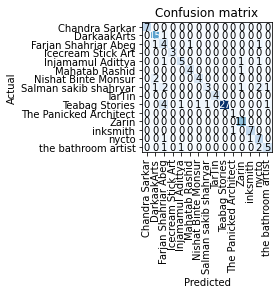

In [88]:
interp.plot_confusion_matrix()

In [81]:
#Sorted descending list of largest non-diagonal entries of confusion matrix, presented as actual, predicted, number of occurrences.
interp.most_confused()

[('Teabag Stories', 'Farjan Shahriar Abeg', 4),
 ('Nishat Binte Monsur', 'DarkaakArts', 2),
 ('Salman sakib shahryar', 'Farjan Shahriar Abeg', 2),
 ('Salman sakib shahryar', 'nycto', 2),
 ('the bathroom artist', 'nycto', 2),
 ('DarkaakArts', 'Farjan Shahriar Abeg', 1),
 ('Farjan Shahriar Abeg', 'DarkaakArts', 1),
 ('Farjan Shahriar Abeg', 'Mahatab Rashid', 1),
 ('Farjan Shahriar Abeg', 'nycto', 1),
 ('Injamamul Adittya', 'Farjan Shahriar Abeg', 1),
 ('Injamamul Adittya', 'Zarin', 1),
 ('Injamamul Adittya', 'nycto', 1),
 ('Mahatab Rashid', 'Zarin', 1),
 ('Salman sakib shahryar', 'DarkaakArts', 1),
 ('Salman sakib shahryar', 'Zarin', 1),
 ('Salman sakib shahryar', 'the bathroom artist', 1),
 ('Teabag Stories', 'Injamamul Adittya', 1),
 ('Teabag Stories', 'Nishat Binte Monsur', 1),
 ('Teabag Stories', 'Salman sakib shahryar', 1),
 ('Teabag Stories', 'the bathroom artist', 1),
 ('inksmith', 'The Panicked Architect', 1),
 ('nycto', 'Farjan Shahriar Abeg', 1),
 ('nycto', 'inksmith', 1),
 ('t

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3503: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

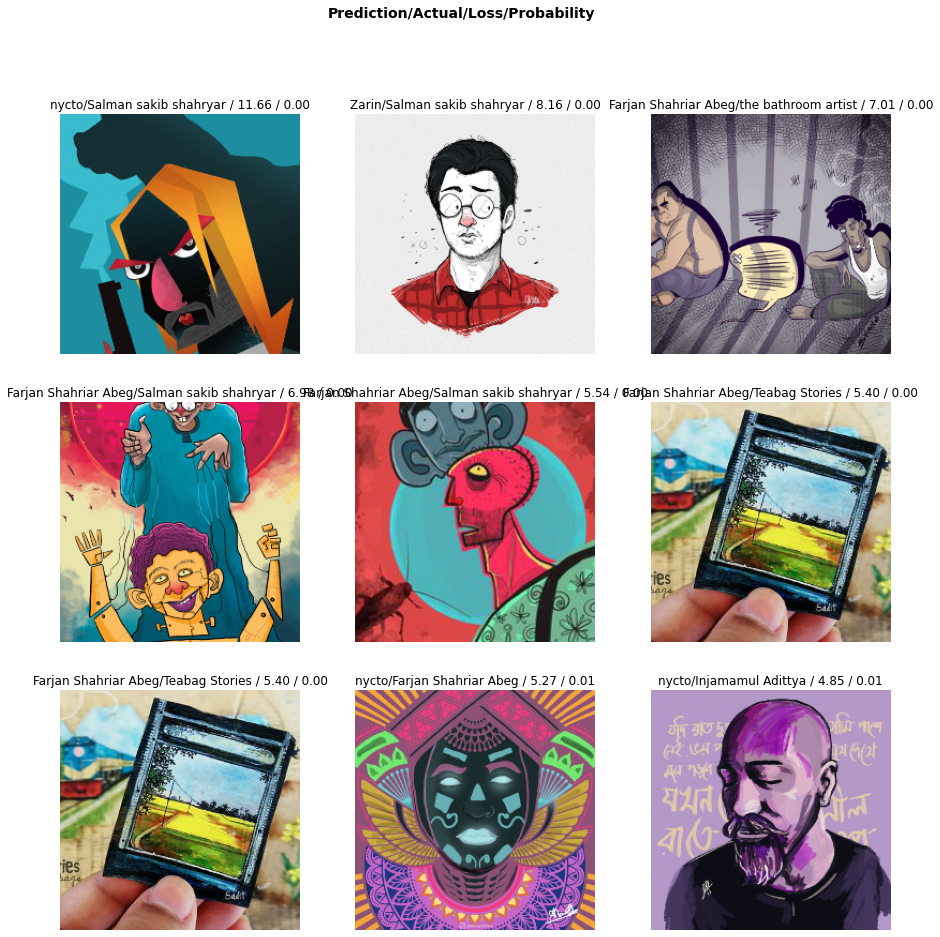

In [84]:
interp.plot_top_losses(9, figsize=(15,15))

In [ ]:
images = [('Vincent Van Gogh', 'https://www.thenational.ae/image/policy:1.850830:1555593331/ac19-APR-art-tate-van-gogh07.jpg?f=16x9&w=1200&$p$f$w=e893890'),
          ('Albrecht Durer', 'https://i.ibb.co/Gphk3yG/Albrecht-D-rer-306.jpg'),
          ('Edgar Degas', 'https://i.ibb.co/7bBFSNW/Edgar-Degas-301.jpg')
         ]

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3103: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpola

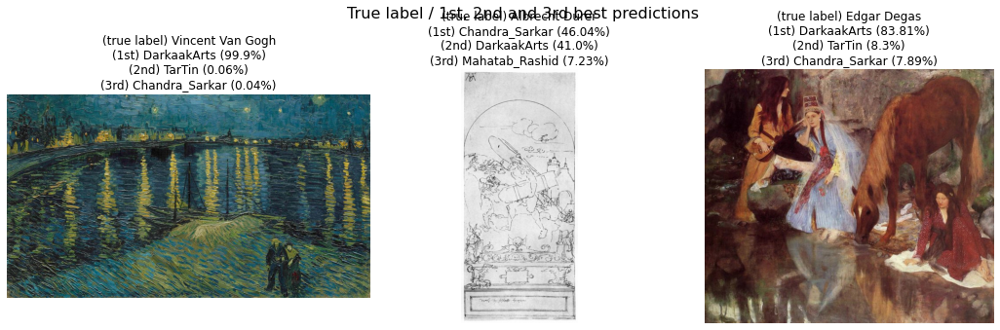

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5))
fig.suptitle('True label / 1st, 2nd and 3rd best predictions', fontsize=16)

for i, image in enumerate(images):
    
    # Get image
    class_name, img_url = image[0], image[1]
    response = requests.get(img_url)
    img = open_image(BytesIO(response.content))

    # Get best first prediction
    pred_1_class, indice, preds = artist_identification.predict(img)

    # Get all best predictions
    preds_sorted, idxs = preds.sort(descending=True)
    
    # Get best 3 predictions - classes
    pred_2_class = artist_identification.data.classes[idxs[1]]
    pred_3_class = artist_identification.data.classes[idxs[2]]
    
    # Get best 3 predictions - probabilities
    pred_1_prob = np.round(100*preds_sorted[0].item(),2)
    pred_2_prob = np.round(100*preds_sorted[1].item(),2)
    pred_3_prob = np.round(100*preds_sorted[2].item(),2)
    preds_best3 = [f'{pred_1_class} ({pred_1_prob}%)', f'{pred_2_class} ({pred_2_prob}%)', f'{pred_3_class} ({pred_3_prob}%)']
    
    # Display images with True label / 1st, 2nd and 3rd best Predictions
    plt.tight_layout()
    img.show(ax=ax[i],
             title=f'(true label) {class_name}\n(1st) {preds_best3[0]}\n(2nd) {preds_best3[1]}\n(3rd) {preds_best3[2]}')